# SECOP II - Contratos Electrónicos

SECOP II es la plataforma pública en Colombia donde se registran los procesos de contratación de las Entidades Estatales registradas

https://dev.socrata.com/foundry/www.datos.gov.co/jbjy-vk9h

### Integrantes

Juan Speck

Julian Buitrago 

Oscar Pachón

### Pregunta

De acuerdo a los datos observados del SECOP II se desea obtener el sector que mayor cantidad dinero invierte en su contratación a nivel de departamento

### Librerias

In [5]:
import pandas as pd
import numpy as np
# pip install sodapy
from sodapy import Socrata
from dataprep.eda import plot
import matplotlib.pyplot as plt
#pip install pandas-profiling
from pandas_profiling import ProfileReport
import plotly.express as px
pd.set_option('display.float_format',lambda x: '%.5f' % x) # Configuramos el ambiente para que 
# muestre datos en número y no usando notación cientifica

### Carga de Datos

In [6]:
pw="Datos.1995%"

Se usa el token que tiene la página de datos abiertos

In [7]:
# Unauthenticated client only works with public data sets. Note 'None'
# in place of application token, and no username or password:
#client = Socrata("www.datos.gov.co", None)

# Example authenticated client (needed for non-public datasets):
client = Socrata("www.datos.gov.co",
                  "oDDpMpf3aXZ4q26Tup5GwhU4D",
                  username="julian.buitrago88@gmail.com",
                  password=pw)

Usamos un query con lenguaje de SQL con el fin de traer solo la información que necesitamos para lograr responder nuestra pregunta inicial, con lo cual, se define un objeto que contenga el equery, para traer solo las columnas a interes del DataFrame de datos abiertos - SECOP II 

In [8]:
query='''
SELECT
nombre_entidad,
departamento,
ciudad,
sector,
id_contrato,
estado_contrato,
tipo_de_contrato,
valor_del_contrato,
valor_de_pago_adelantado,
descripcion_del_proceso,
fecha_de_inicio_del_contrato,
fecha_de_firma,
fecha_de_fin_del_contrato,
valor_facturado,
modalidad_de_contratacion
WHERE estado_contrato not in("Borrador", "enviado Proveedor", "En aprobación", "Suspendido") 
AND fecha_de_fin_del_contrato < '2200-12-31' 
limit 2000000
'''
# En esta linea "fecha_de_fin_del_contrato < '2200-12-31'" debido a que se identifico que existe uno o varios registros con una fecha no valida

results2 = client.get("jbjy-vk9h", query=query)
results_df2 = pd.DataFrame.from_records(results2)

### Analisis exploratorio de la base de datos usando el query

Revisamos la dimensión de la báse de datos del Dataset de SECOP II

In [9]:
results_df2.columns

Index(['nombre_entidad', 'departamento', 'ciudad', 'sector', 'id_contrato',
       'estado_contrato', 'tipo_de_contrato', 'valor_del_contrato',
       'valor_de_pago_adelantado', 'descripcion_del_proceso',
       'fecha_de_inicio_del_contrato', 'fecha_de_firma',
       'fecha_de_fin_del_contrato', 'valor_facturado',
       'modalidad_de_contratacion'],
      dtype='object')

In [10]:
results_df2.shape

(1210904, 15)

Observamos una muestra de los datos contenidos en el Dataset de SECOP II

In [11]:
results_df2.sample(6)

,nombre_entidad,departamento,ciudad,sector,id_contrato,estado_contrato,tipo_de_contrato,valor_del_contrato,valor_de_pago_adelantado,descripcion_del_proceso,fecha_de_inicio_del_contrato,fecha_de_firma,fecha_de_fin_del_contrato,valor_facturado,modalidad_de_contratacion
67950,Secretaria Distrital de Integración Social - O...,Distrito Capital de Bogotá,No Definido,Inclusión Social y Reconciliación,CO1.PCCNTR.843627,Activo,Prestación de servicios,31830000,0,PRESTAR SERVICIOS PARA LA ATENCIÓN INTEGRAL A ...,2019-02-26T00:00:00.000,2019-03-07T20:03:12.000,2019-12-25T00:00:00.000,22505000,Contratación directa
488603,DEPARTAMENTO ADMINISTRATIVO NACIONAL DE ESTADÍ...,Atlántico,No Definido,Información Estadística,CO1.PCCNTR.2711126,En ejecución,Prestación de servicios,1581585,0,GOBIERNO_2021_EDI_EDID_ TH_TU_OT_IINT_ Prestac...,2021-08-02T00:00:00.000,2021-07-29T11:07:37.000,2021-08-31T00:00:00.000,0,Contratación directa
1173163,SUBRED INTEGRADA DE SERVICIOS DE SALUD SUR OCC...,Distrito Capital de Bogotá,No Definido,Salud y Protección Social,CO1.PCCNTR.785115,Modificado,Prestación de servicios,20052014,0,Prestar servicios Profesionales a la gestión a...,2019-02-01T00:00:00.000,2019-02-04T14:02:05.000,2020-01-31T00:00:00.000,0,Contratación régimen especial
807792,UNIDAD PRESTADORA DE SALUD NARIÑO,Nariño,No Definido,defensa,CO1.PCCNTR.445745,Modificado,Prestación de servicios,15000000,0,PRESTACIÓN DE SERVICIOS DE SALUD DE FONOAUDIOL...,2018-06-21T00:00:00.000,2018-06-19T15:06:42.000,2019-04-30T00:00:00.000,0,Mínima cuantía
639974,ARMADA NACIONAL BASE NAVAL No. 6 ARC BOGOTA,Distrito Capital de Bogotá,Bogotá,defensa,CO1.PCCNTR.151305,Activo,Compraventa,116749015,0,ADQUISICION DE EQUIPOS Y REPUESTOS DE COMUNICA...,2017-05-25T00:00:00.000,2017-07-10T15:07:59.000,2017-09-05T00:00:00.000,0,Selección Abreviada de Menor Cuantía
280979,SECRETARIA DISTRITAL DE LA MUJER,Distrito Capital de Bogotá,Bogotá,Servicio Público,CO1.PCCNTR.2919519,En ejecución,Prestación de servicios,24000000,0,Prestar servicios profesionales para brindar a...,2021-10-08T00:00:00.000,2021-10-07T19:10:50.000,2021-12-31T00:00:00.000,14133333,Contratación directa


Se visualiza los valores null que contiene el Dataset frente a laas columnas a interes

In [12]:
results_df2.isnull().sum()

nombre_entidad                      0
departamento                        0
ciudad                              0
sector                              0
id_contrato                         0
estado_contrato                     0
tipo_de_contrato                    0
valor_del_contrato                  0
valor_de_pago_adelantado            0
descripcion_del_proceso             0
fecha_de_inicio_del_contrato    31437
fecha_de_firma                     20
fecha_de_fin_del_contrato           0
valor_facturado                     0
modalidad_de_contratacion           0
dtype: int64

El siguiente paso, es revisar como esta definido el dataset, que tipo de datos son:

In [13]:
results_df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1210904 entries, 0 to 1210903
Data columns (total 15 columns):
 #   Column                        Non-Null Count    Dtype 
---  ------                        --------------    ----- 
 0   nombre_entidad                1210904 non-null  object
 1   departamento                  1210904 non-null  object
 2   ciudad                        1210904 non-null  object
 3   sector                        1210904 non-null  object
 4   id_contrato                   1210904 non-null  object
 5   estado_contrato               1210904 non-null  object
 6   tipo_de_contrato              1210904 non-null  object
 7   valor_del_contrato            1210904 non-null  object
 8   valor_de_pago_adelantado      1210904 non-null  object
 9   descripcion_del_proceso       1210904 non-null  object
 10  fecha_de_inicio_del_contrato  1179467 non-null  object
 11  fecha_de_firma                1210884 non-null  object
 12  fecha_de_fin_del_contrato     1210904 non-

Al revisar el dataset, debemos de realizar una conversión de las columnas que son objetos a datos fecha

In [14]:
results_df2['fecha_de_firma ']= pd.to_datetime(results_df2['fecha_de_firma'], format='%Y-%m-%d %H:%M:%S.%f')
results_df2['fecha_de_inicio_del_contrato']= pd.to_datetime(results_df2['fecha_de_fin_del_contrato'], format='%Y-%m-%d %H:%M:%S.%f')
results_df2['fecha_de_fin_del_contrato']= pd.to_datetime(results_df2['fecha_de_fin_del_contrato'], format='%Y-%m-%d %H:%M:%S.%f')

De igual manera, se realiza la conversión de las columnas que son objetos a datos númericos

In [15]:
results_df2['valor_del_contrato']=results_df2['valor_del_contrato'].astype(float).astype(int)
results_df2['valor_facturado']=results_df2['valor_facturado'].astype(float).astype(int)

Despues de realizar la conversión, revisamos el tipo de datos que tenemos en el dataset

In [16]:
results_df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1210904 entries, 0 to 1210903
Data columns (total 16 columns):
 #   Column                        Non-Null Count    Dtype         
---  ------                        --------------    -----         
 0   nombre_entidad                1210904 non-null  object        
 1   departamento                  1210904 non-null  object        
 2   ciudad                        1210904 non-null  object        
 3   sector                        1210904 non-null  object        
 4   id_contrato                   1210904 non-null  object        
 5   estado_contrato               1210904 non-null  object        
 6   tipo_de_contrato              1210904 non-null  object        
 7   valor_del_contrato            1210904 non-null  int32         
 8   valor_de_pago_adelantado      1210904 non-null  object        
 9   descripcion_del_proceso       1210904 non-null  object        
 10  fecha_de_inicio_del_contrato  1210904 non-null  datetime64[ns]
 11

Como existen 31437registros no disponible o NA para el campo fecha_de_inicio_del_contrato, se dedide sustituir los valores de este campo, por la fecha_de_firma, partiendo de que a nivel legal, la fecha de la firma puede sustituir la fecha de inicio del contrato.

In [17]:
results_df2['fecha_de_inicio_del_contrato']=results_df2['fecha_de_inicio_del_contrato'].fillna(results_df2['fecha_de_firma'])

Se genera dos (2) columnas con el fin de extraer el valor de año para las columnas de "fecha_de_fin_del_contrato" y "fecha_de_inicio_del_contrato"

In [18]:
#results_df2['agno_de_firma'] = results_df2['fecha_de_firma'].dt.year.astype("object")
results_df2['agno_de_fin_del_contrato'] = results_df2['fecha_de_fin_del_contrato'].dt.year.astype("object")
results_df2['agno_de_inicio_del_contrato'] = results_df2['fecha_de_inicio_del_contrato'].dt.year.astype(int).astype("object")

Generamos un resumen de las columnas numéricas:

In [19]:
results_df2.describe().round(5)

,valor_del_contrato,valor_facturado
count,1210904.00000,1210904.00000
mean,34092255.69595,11754538.98801
std,267498354.09706,107922141.37770
min,-2147483648.00000,-2147483648.00000
25%,8870064.75000,0.00000
50%,19090000.00000,0.00000
75%,38785868.00000,12000000.00000
max,2147344489.00000,2147286307.00000


In [21]:
#fig = px.box(results_df2, x= 'sector',y= "valor_del_contrato")
#fig.show()

Generamos un resumen de las columnas categoricas:

In [22]:
results_df2.describe(include = ['O'])

,nombre_entidad,departamento,ciudad,sector,id_contrato,estado_contrato,tipo_de_contrato,valor_de_pago_adelantado,descripcion_del_proceso,fecha_de_firma,modalidad_de_contratacion,agno_de_fin_del_contrato,agno_de_inicio_del_contrato
count,1210904,1210904,1210904,1210904,1210904,1210904,1210904,1210904,1210904,1210884,1210904,1210904,1210904
unique,2082,34,525,25,1210902,7,23,1417,667825,569495,16,35,35
top,Secretaria Distrital de Integración Social - O...,Distrito Capital de Bogotá,No Definido,Servicio Público,CO1.PCCNTR.2413008,En ejecución,Prestación de servicios,0,PRESTAR SERVICIOS DE APOYO A LA GESTION ASISTE...,2021-02-12T18:02:08.000,Contratación directa,2021,2021
freq,32349,606037,348487,229660,2,452192,1014644,1209282,9449,20,897936,542040,542040


Se revisa los rangos de fechas para ver datos erroneos, cuando se encuentra el primer registro y el ultimo registro

In [23]:
pd.to_datetime(results_df2['fecha_de_fin_del_contrato'], format='%Y-%m-%d %H:%M:%S.%f').min()

Timestamp('2008-06-09 00:00:00')

In [24]:
pd.to_datetime(results_df2['fecha_de_fin_del_contrato'], format='%Y-%m-%d %H:%M:%S.%f').max()

Timestamp('2121-12-31 00:00:00')

### Analisis exploratorio de los datos usando dos librerias

Se utiliza la liberia de dataprep con el fin de entender el dataset


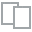
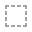
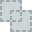
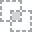
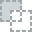
...
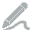
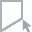
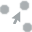
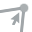
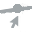

In [139]:
plot(results_df2)

Se utiliza la liberia de pandas_profiling con el fin de entender el dataset

In [140]:
#prof = ProfileReport(results_df2)
#prof.to_file(output_file='output.html')
prof2=ProfileReport(results_df2,explorative=True)

In [141]:
prof2

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

Al revisar los datos, destacamos que se puede inferir bajo el reporte previo, que los atributos de "tipo_de_contrato" tiene una alta correlación con la columna de "modalidad_de_contratacion", al igual que "departamento" tiene una alta correlación con el "sector" al cual se contrata.

### Resolvemos la pregunta inicial

De acuerdo a los datos observados del SECOP II se desea obtener cual es el sector que mayor contratación se tiene año a año.

A. Para dar respuesta a la pregunta, se uso la función de plot de la libreria "Dataprep", obteniendo que el año que tuvo mayor gasto es 2021, con un valor 18.225.693.728.726 COP (Pesos moneda corriente) y a su vez el sector de "Servicio Público" con 4.109.896.386.920 COP tuvo el mayor gasto en los contratos registrados en el SECOP II. 

Se puede inferir que el comportamiento de los sectores con mayor contratación en (2015/2021) no es lineal ; es decir , se presenta una variación año a año en el sectores en el tasa o valor de la contratación.

In [30]:
bysector = results_df2.groupby(['agno_de_inicio_del_contrato','sector'])[['valor_del_contrato']].sum()

In [31]:
df2 = bysector.sort_values(['valor_del_contrato','agno_de_inicio_del_contrato'],
              ascending = [False, True])
df2.head(30)

valor_del_contrato
agno_de_inicio_del_contrato sector                                               
2021                        Servicio Público                  4109896386920.00000
                            Salud y Protección Social         2922820974062.00000
                            No aplica/No pertenece            2062841804869.00000
2020                        Salud y Protección Social         1843212099073.00000
                            Servicio Público                  1561316364923.00000
2021                        defensa                           1185347522694.00000
2022                        Salud y Protección Social         1163185772932.00000
2018                        defensa                           1152626563607.00000
2021                        Trabajo                           1132918905088.00000
2020                        defensa                           1129518023339.00000
2019                        defensa                           1121570263148.00000
2020                        Trabajo                            951680819961.00000
2021                        Ambiente y Desarrollo Sostenible   834180486918.00000
                            Transporte                         829755541204.00000
2020                        No aplica/No pertenece             822050714863.00000
2021                        Educación Nacional                 801549062116.00000
2019                        Servicio Público                   743531463275.00000
2021                        Inclusión Social y Reconciliación  703970088537.00000
2019                        Salud y Protección Social          612980936563.00000
2018                        Servicio Público                   594281595677.00000
2020                        Inclusión Social y Reconciliación  562721127168.00000
2021                        Cultura                            499444036218.00000
2020                        Ambiente y Desarrollo Sostenible   446515439635.00000
2022                        Servicio Público                   405576339324.00000
2020                        Educación Nacional                 405257230984.00000
2018                        Salud y Protección Social          368604610453.00000
2021                        Hacienda y Crédito Público         365687437602.00000
                            deportes                           356342194688.00000
2019                        Transporte                         349844834246.00000
2020                        Transporte                         347369350514.00000


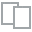
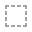
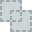
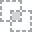
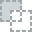
...
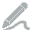
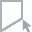
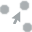
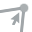
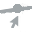

In [32]:
plot(results_df2,'agno_de_inicio_del_contrato','sector')

El distrito capital de Bogotá, fue el departamento con mayor gasto

In [33]:
results_df2.groupby(['departamento','sector'])[['valor_del_contrato']].sum().sort_values(
   by="valor_del_contrato",ascending=False)

valor_del_contrato
departamento               sector                                               
Distrito Capital de Bogotá Salud y Protección Social         4152402753458.00000
                           defensa                           2402333553583.00000
                           Servicio Público                  1831144537216.00000
                           Inclusión Social y Reconciliación 1673301638196.00000
                           Transporte                        1361467206360.00000
...                                                                          ...
Putumayo                   Salud y Protección Social           -9691005039.00000
Cundinamarca               Hacienda y Crédito Público         -12159204030.00000
Córdoba                    Salud y Protección Social          -40914922844.00000
Magdalena                  Salud y Protección Social          -55501078396.00000
La Guajira                 No aplica/No pertenece             -68464797086.00000

[401 rows x 1 columns]

Por otro lado, al observar los datos obtenidos en el SECOP, se observa que el año 2021 fue el año con mayor gasto, con 18.225.693.728.726 COP

In [34]:
results_df2.groupby(['agno_de_inicio_del_contrato'])[['valor_del_contrato']].sum().sort_values(
   by="valor_del_contrato",ascending=False)

,valor_del_contrato
agno_de_inicio_del_contrato,
2021,18225693728726.00000
2020,10808102940011.00000
2019,5776456756405.00000
2018,4427318261403.00000
2022,2489303114925.00000
2017,795390262131.00000
2016,48868647473.00000
2015,1316847762.00000
2049,779348616.00000


In [104]:
#results_df2.to_excel('test.xlsx')

In [32]:
#datos2=results_df2.groupby(['sector','tipo_de_contrato']).agg({'valor_del_contrato':['min','mean','max']})
#datos2

Generamos una tabla resumen en donde realiza la sumatoria de los datos agrupados según el departamento y sector. 

In [95]:
#g1 = results_df2.groupby(['agno_de_inicio_del_contrato','departamento','sector']).sum().reset_index();g1 # Sigue manteniendo la información

In [22]:
#datos = results_df2.groupby(['departamento'])[['valor_del_contrato']].mean();datos

In [25]:
#plot(g1)

In [26]:
#plot(results_df2,'agno_de_inicio_del_contrato','sector')

In [55]:

#results_df2['agno_de_inicio_del_contrato']= pd.to_datetime(g1['agno_de_inicio_del_contrato'], format='%Y')

In [46]:
#g2=g1.pivot_table(index= ('departamento','sector'), columns='agno_de_inicio_del_contrato', values='valor_del_contrato').fillna(0) # Pivoteamos la tabla

In [27]:
#results_df2['sector'].value_counts('')

In [28]:
#plot(g1,'departamento','sector')